In [91]:
import os, subprocess
import tensorflow as tf
from tensorflow import set_random_seed
import numpy as np
from numpy.random import seed
from math import floor
from functions import load_data, flatten, unflatten, update_points, get_plot

# Examine Inputs

Let's load some local data and examine its contents. We'll play a small animation that contains the first few temporal frames of the input data below.

Note: we plot animations with "unflat" and we train on "flat".

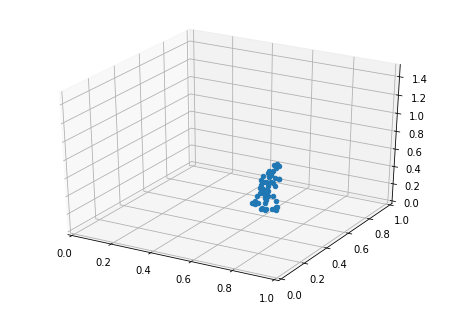

In [74]:
unflat = np.load("../data/npy/mariel_beyond.npy")
labels = ['ARIEL.position', 'C7.position', 'CLAV.position', 'LANK.position', 'LBHD.position', 'LBSH.position', 'LBWT.position', 'LELB.position', 'LFHD.position', 'LFRM.position', 'LFSH.position', 'LFWT.position', 'LHEL.position', 'LIEL.position', 'LIHAND.position', 'LIWR.position', 'LKNE.position', 'LKNI.position', 'LMT1.position', 'LMT5.position', 'LOHAND.position', 'LOWR.position', 'LSHN.position', 'LTHI.position', 'LTOE.position', 'LUPA.position', 'LabelingHips.position', 'MBWT.position', 'MFWT.position', 'RANK.position', 'RBHD.position', 'RBSH.position', 'RBWT.position', 'RELB.position', 'RFHD.position', 'RFRM.position', 'RFSH.position', 'RFWT.position', 'RHEL.position', 'RIEL.position', 'RIHAND.position', 'RIWR.position', 'RKNE.position', 'RKNI.position', 'RMT1.position', 'RMT5.position', 'ROHAND.position', 'ROWR.position', 'RSHN.position', 'RTHI.position', 'RTOE.position', 'RUPA.position', 'STRN.position', 'SolvingHips.position', 'T10.position']
n_vertices, n_time, n_dims = unflat.shape
flat = X.swapaxes(0, 1).reshape((n_time, n_vertices * n_dims), order='C')
HTML(get_plot(unflat[:,300:,:], frames=200)) # skip the first 300 frames to get to the good part

In [75]:
# train_x has shape: n_samples, look_back, n_vertices*3
look_back = 10 # number of previous time slices to use to predict the time positions at time `i`
train_x = []
train_y = []

# each i is a timeslice; these time slices start at idx `look_back` (so we can look back `look_back` slices)
for i in range(look_back, n_time-1, 1):
  train_x.append( flat[i-look_back:i, :] )
  train_y.append( flat[i:i+1] )
  
train_x = np.array(train_x)
train_y = np.concatenate(train_y, axis=0)

train_x.shape, train_y.shape

((6792, 10, 165), (6792, 165))

# Build the Model

In [90]:
from utils.mdn import MDN
from keras.models import Sequential, Model
from keras.layers import Dense, LSTM, Dropout, Activation, CuDNNLSTM
from keras.layers.advanced_activations import LeakyReLU
from keras.losses import mean_squared_error
from keras.optimizers import Adam
from keras import backend as K
import keras, os

# config
cells = [32, 32, 32, 32] # number of cells in each lstm layer
output_dims = n_vertices * n_dims # number of coordinate values to be predicted by each gaussian model
input_shape = (look_back, output_dims) # shape of each input feature
use_mdn = True # whether to use the MDN final layer or not
n_mixes = 2 # number of gaussian models to build if use_mdn == True

# optimizer params
lr = 0.00001 # the learning rate of the model
optimizer = Adam(lr=lr, clipvalue=0.5)

# use tensorflow backend
os.environ['KERAS_BACKEND'] = 'tensorflow'

# determine the LSTM cells to use (hinges on whether GPU is available to keras)
gpus = K.tensorflow_backend._get_available_gpus()
LSTM_UNIT = CuDNNLSTM if len(gpus) > 0 else LSTM
print('GPUs found:', gpus)

# build the model
model = Sequential()
model.add(LSTM_UNIT(cells[0], return_sequences=True, input_shape=input_shape, ))
model.add(LSTM_UNIT(cells[1], return_sequences=True, ))
model.add(LSTM_UNIT(cells[2], ))
model.add(Dense(cells[3]), )

if use_mdn:
  mdn = MDN(output_dims, n_mixes)
  model.add(mdn)
  model.compile(loss=mdn.get_loss_func(), optimizer=optimizer, metrics=['accuracy'])
else:
  model.add(Dense(output_dims, activation='tanh'))
  model.compile(loss=mean_squared_error, optimizer=optimizer, metrics=['accuracy'])

model.summary()

GPUs found: []


TypeError: while_loop() got an unexpected keyword argument 'maximum_iterations'

In [ ]:
# check untrained (baseline) accuracy
samples = 1
model.evaluate(train_x[:samples], train_y[:samples])

# Train the model

In [ ]:
from keras.callbacks import TerminateOnNaN
from livelossplot import PlotLossesKeras
from datetime import datetime
import time, keras, os, json
  
class Logger(keras.callbacks.Callback):
  '''Save the model and its weights every `self.save_frequency` epochs'''
  def __init__(self):
    self.epoch = 0 # stores number of completed epochs
    self.save_frequency = 1 # configures how often we'll save the model and weights
    self.date = datetime.fromtimestamp(time.time()).strftime('%Y-%m-%d-%H:%M')
    if not os.path.exists('snapshots'): os.makedirs('snapshots')
    self.save_config()
    
  def save_config(self):
    with open('snapshots/' + self.date + '-config.json', 'w') as out:
      json.dump({
        'look_back': look_back,
        'cells': cells,
        'use_mdn': use_mdn,
        'n_mixes': n_mixes,
        'lr': lr,
      }, out)
  
  def on_batch_end(self, batch, logs={}, shape=train_x.shape):
    if (batch+1 == shape[0]): # batch value is batch index, which is 0-based
      self.epoch += 1
      if (self.epoch > 0) and (self.epoch % self.save_frequency == 0):
        path = 'snapshots/' + self.date + '-' + str(batch)
        model.save(path + '.model')
        model.save_weights(path + '.weights')

#K.set_value(optimizer.lr, 0.00001)
callbacks = [Logger(), TerminateOnNaN()]
history = model.fit(train_x, train_y, epochs=50, batch_size=1, shuffle=False, callbacks=callbacks)

In [ ]:
# grok the layer weights
for layer_idx, layer in enumerate(model.layers): 
  for weight_block in layer.get_weights():
    print(np.min(weight_block), np.max(weight_block), weight_block.shape, )

In [ ]:
save = False
load = True
model_path = 'snapshots/2018-10-26-17:53-496'
if not os.path.exists('snapshots'): os.makedirs('snapshots')

if save:
  model.save(model_path + '.model')
  model.save_weights(model_path + '.weights')
  
if load:
  model.load_weights(model_path + '.weights')

# Visualize Results

First let's analyze how well the model learned the input sequence

### Assess Model Performance on Inputs

In [ ]:
# visualize how well the model learned the input sequence
n_frames = 500 # n frames of time slices to generate
frames = []

test_x = train_x[:n_frames] # data to pass into forward prop through the model
y_pred = model.predict(test_x) # output with shape (n_frames, (output_dims+2) * n_mixes )

# partition out the mus, sigs, and mixture weights
for i in range(n_frames):
  y = y_pred[i].squeeze()
  mus = y[:n_mixes*output_dims]
  sigs = y[n_mixes*output_dims:n_mixes*output_dims + n_mixes]
  alphas = y[-n_mixes:]

  # find the most likely distribution - then disregard that number and use the first Gaussian :)
  alpha_idx = np.argmax(alphas)
  alpha_idx = 0
  
  # pull out the mus that correspond to the selected alpha index
  positions = mus[alpha_idx * output_dims:(alpha_idx+1) * output_dims]
  frames.append(positions)
  
frames = np.array(frames)

In [ ]:
# skip the first look_back frames
HTML(get_plot(frames, frames=n_frames, run_tests=False))

### Assess Model's Ability to Generate New Sequences

In [ ]:
def softmax(x):
  """Compute softmax values for each sets of scores in x."""
  r = np.exp(x - np.max(x))
  return r / r.sum()

n_frames = 500 # n frames of time slices to generate
frames = []

seed = np.random.randint(0, len(train_x)-1)
x = np.expand_dims(train_x[seed], axis=0)
print(' * seeding with', seed)

for i in range(n_frames):
  y = model.predict(x).squeeze()
  mus = y[:n_mixes*output_dims]
  sigs = y[n_mixes*output_dims:-n_mixes]
  alphas = softmax(y[-n_mixes:])
  
  # select the alpha channel to use
  alpha_idx = np.argmax(alphas)
  
  # grab the mus and sigs associated with the selected alpha_idx
  frame_mus = mus.ravel()[alpha_idx*output_dims : (alpha_idx+1)*output_dims]
  frame_sig = sigs[alpha_idx] / 100
  
  # now sample from each Gaussian
  positions = [np.random.normal(loc=m, scale=frame_sig) for m in frame_mus]
  positions = frame_mus
  
  # add these positions to the results
  frames.append(positions)
  
  # pull out a new training example - stack the new result on
  # all values after the first from the bottom-most value in the x's
  start = x[:,1:,:]
  end = np.expand_dims( np.expand_dims(positions, axis=0), axis=0 )
  x = np.concatenate((start, end), axis=1)
  
frames = np.array(frames)

In [ ]:
HTML(get_plot(frames, frames=n_frames, run_tests=False))

In [ ]:
# save the new frames as a JSON array for WebGL visualizations

import json

with open('dance.json', 'w') as out:
  json.dump(unflatten(frames, run_tests=False).tolist(), out)